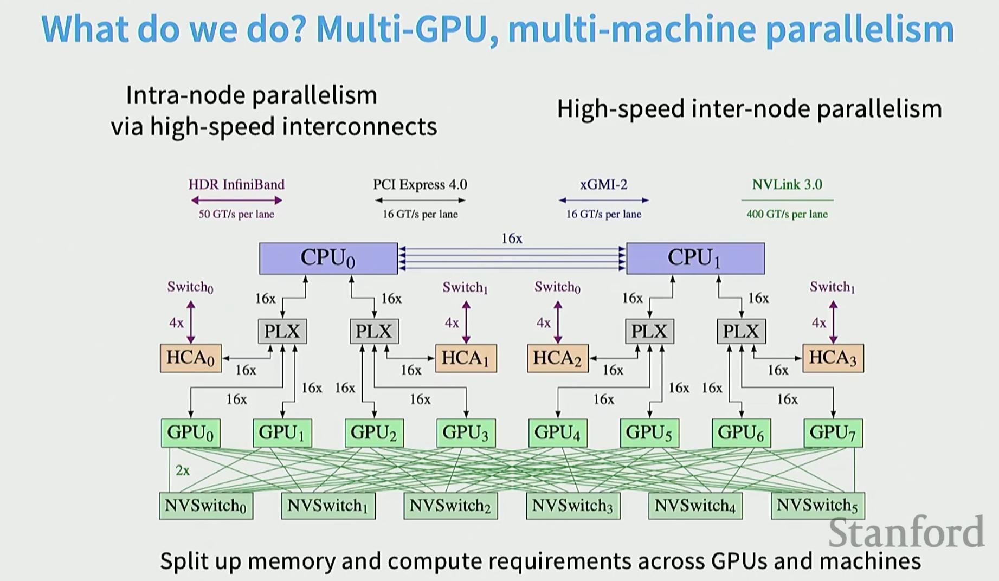

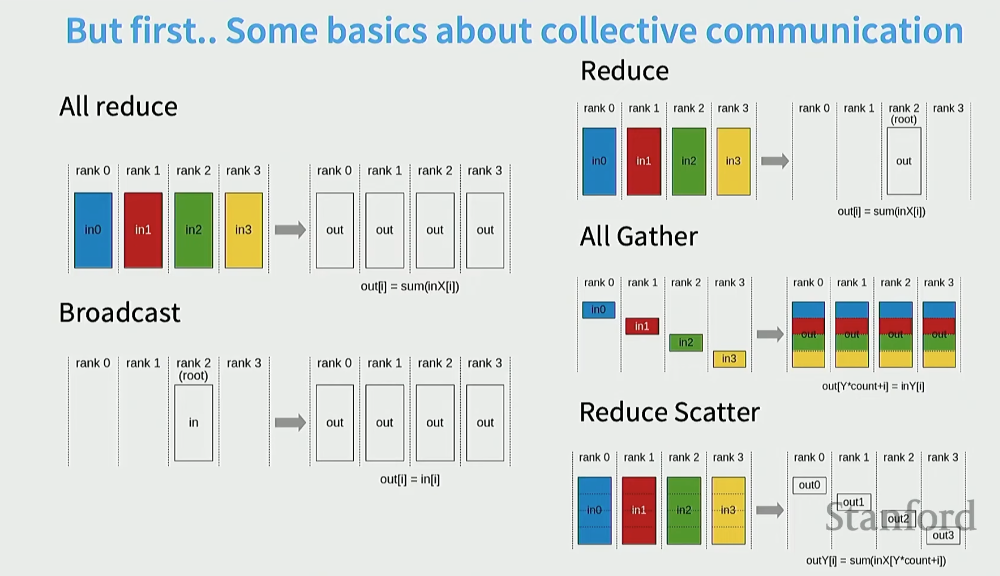

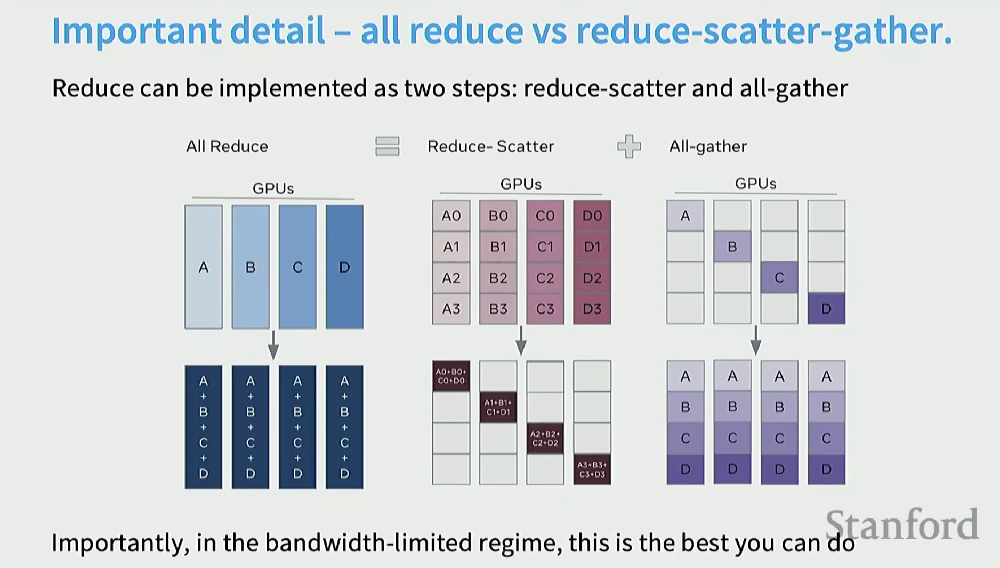

# ReduceScatter + AllGather = AllReduce

  Combining a ReduceScatter and an AllGather is functionally equivalent to an AllReduce. This is often done as a performance optimization strategy, as breaking the operation into two
  phases can lead to better utilization of network bandwidth.

  Let's break down each primitive and then see how they combine.

  ## The Primitives

  Imagine we have N nodes (e.g., N GPUs), and each node has a vector (or tensor) of data. Let's call them V_0, V_1, ..., V_{N-1}. Our goal is to compute the sum S = V_0 + V_1 + ... +
  V_{N-1} and make this final sum S available to all N nodes.

  ### 1. AllReduce
  * **What it does**: This is the most straightforward collective operation. It performs a reduction (e.g., sum) on the vectors from all nodes and distributes the final result to all
  nodes.
  * **Initial State**: Node i has vector V_i.
  * **Final State**: Every node (0 to N-1) holds the complete final vector S.

  ### 2. ReduceScatter
  * **What it does**: This operation performs a reduction (like AllReduce) but instead of distributing the entire result to everyone, it scatters chunks of the result across the
  nodes.
  * **Initial State**: Node i has vector V_i.
  * **Process**:
    1. The sum S is computed internally, just like in AllReduce.
    2. The resulting vector S is split into N chunks: S_chunk_0, S_chunk_1, ..., S_chunk_{N-1}.
    3. Node i receives only the i-th chunk, S_chunk_i.
  * **Final State**: Node i holds only S_chunk_i. No node has the full result.

  ### 3. AllGather
  * **What it does**: This is the inverse of a scatter. Every node starts with a chunk of data, and at the end, every node has all the chunks, concatenated into the full vector.
  * **Initial State**: Node i has a data chunk C_i.
  * **Process**: Each node sends its chunk to all other nodes.
  * **Final State**: Every node holds the complete, concatenated vector C = concat(C_0, C_1, ..., C_{N-1}).

  ---

  ## The Equivalence: ReduceScatter + AllGather = AllReduce

  Now, let's trace the data flow for the two-step process. We'll use the same initial state as the AllReduce example.

  **Scenario**: 4 GPUs (GPU0, GPU1, GPU2, GPU3). Each has a vector.
  * GPU0 has V0
  * GPU1 has V1
  * GPU2 has V2
  * GPU3 has V3

  The goal is to get S = V0 + V1 + V2 + V3 on all 4 GPUs.

  ### Step 1: ReduceScatter

  1. The system computes the sum S = V0 + V1 + V2 + V3.
  2. The result S is split into 4 chunks: S_chunk0, S_chunk1, S_chunk2, S_chunk3.
  3. The chunks are scattered.
     * GPU0 receives S_chunk0.
     * GPU1 receives S_chunk1.
     * GPU2 receives S_chunk2.
     * GPU3 receives S_chunk3.

  **State after ReduceScatter**: Each GPU has a unique piece of the final answer.

  ### Step 2: AllGather

  1. The inputs for this stage are the chunks from the previous stage.
  2. Each GPU puts its chunk on the table for everyone to see.
     * GPU0 provides S_chunk0 to all others.
     * GPU1 provides S_chunk1 to all others.
     * GPU2 provides S_chunk2 to all others.
     * GPU3 provides S_chunk3 to all others.
  3. Each GPU gathers all the chunks and concatenates them.
     * GPU0 gathers {S_chunk0, S_chunk1, S_chunk2, S_chunk3} and reconstructs S.
     * GPU1 gathers {S_chunk0, S_chunk1, S_chunk2, S_chunk3} and reconstructs S.
     * And so on for GPU2 and GPU3.

  **Final State**: All 4 GPUs now have the full vector S.

  This is the exact same final state as if we had performed a single AllReduce operation.

  ## Why is this useful?

  This two-phase approach can be more efficient. The famous ring-allreduce algorithm is a classic example, but it can be suboptimal. By splitting the operation, communication can be
  pipelined more effectively.

  * **Bandwidth Utilization**: ReduceScatter and AllGather have different communication patterns. ReduceScatter involves both computation and communication, while AllGather is purely
  communication. Separating them allows a distributed execution engine (like NVIDIA's NCCL) to choose the most optimal algorithm for each phase based on the tensor size, number of
  nodes, and network topology (e.g., NVLink vs. PCIe). For large tensors, this two-phase approach can often saturate network bandwidth more effectively than a single, complex
  AllReduce algorithm.


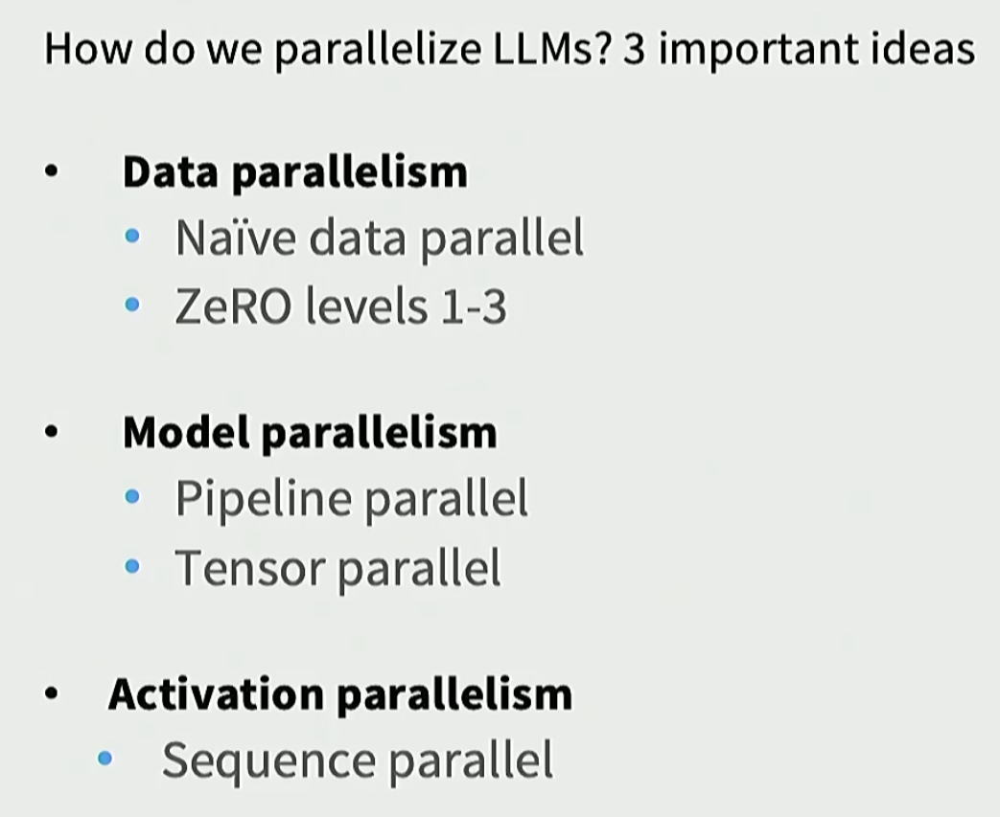

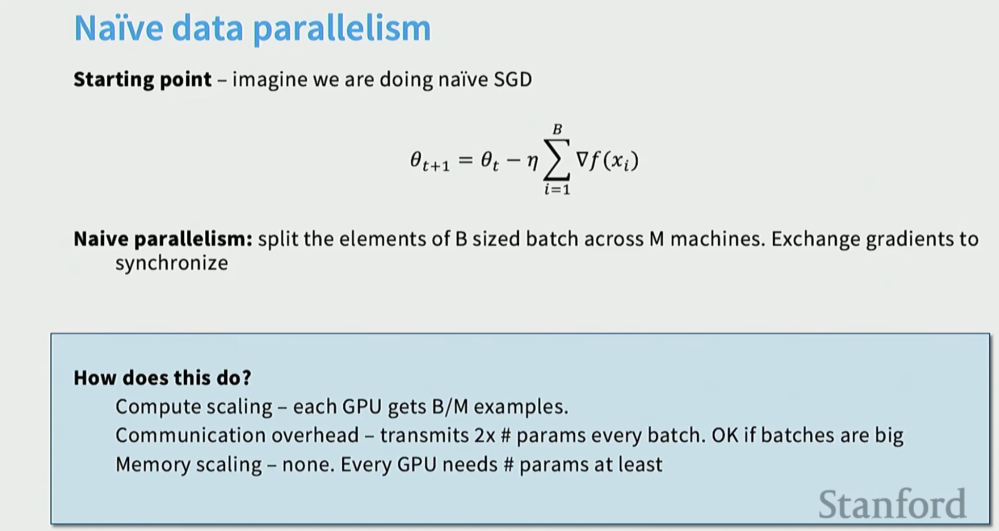

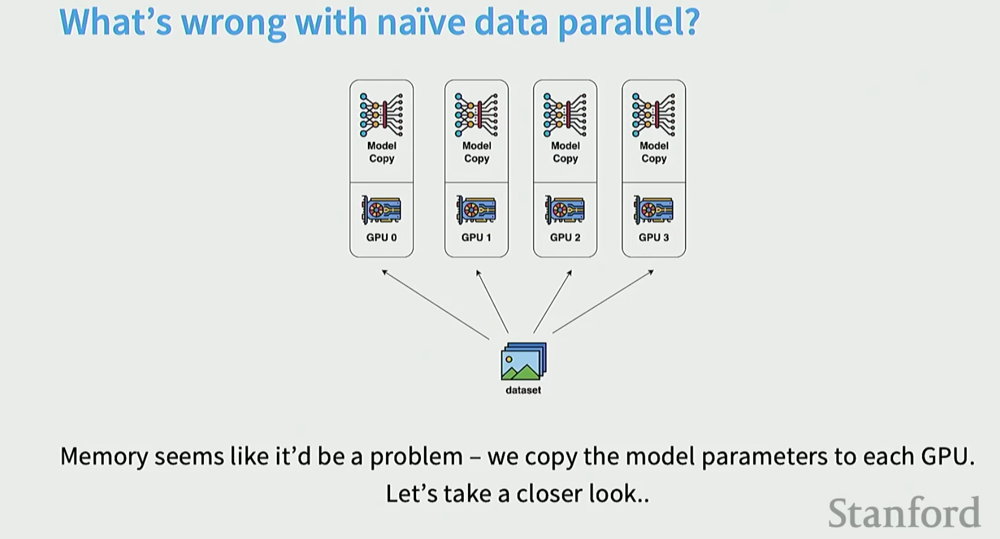

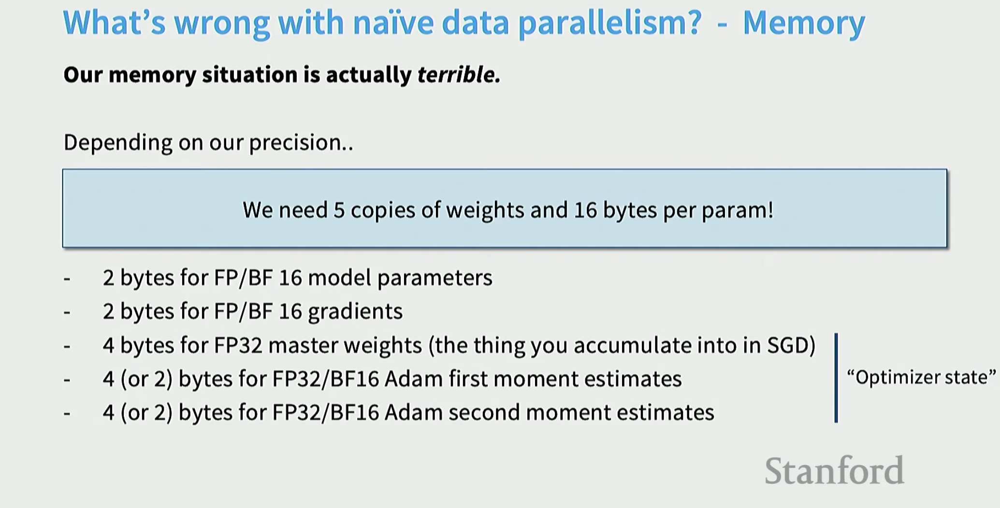

# FSDP (Fully Sharded Data Parallel)

  FSDP, or Fully Sharded Data Parallel, is a modern technique for training large-scale deep learning models. It's directly related to our previous discussion because it heavily relies
   on ReduceScatter and AllGather to manage memory and communication efficiently.

  Let's break it down.

  ## What is FSDP?

  First, let's recall standard Data Parallelism (like PyTorch's DistributedDataParallel or DDP). In DDP:
  1. Every GPU gets a full copy of the entire model (parameters, gradients, and optimizer states).
  2. Every GPU processes a different slice of the input data.
  3. After the backward pass, the gradients calculated on each GPU are averaged across all GPUs using an AllReduce operation.
  4. Each GPU then updates its local copy of the model with the averaged gradients.

  **The problem?** The model must fit entirely on a single GPU. For massive models like modern LLMs, this is impossible.

  FSDP solves this. The "Fully Sharded" part means that instead of replicating the entire model on every GPU, the model components are sharded (split up) across the available GPUs.
  Specifically, FSDP shards:
  1. Model Parameters (Weights)
  2. Gradients
  3. Optimizer States (e.g., Adam's momentum and variance terms, which can be huge)

  Each GPU is only responsible for a fraction of the overall model, dramatically reducing the memory footprint on each device.

  ## How Does FSDP Relate to ReduceScatter and AllGather?

  This is the crucial part. FSDP uses these two operations to cleverly manage the sharded components during the forward and backward passes. It ensures that each GPU has the weights
  it needs exactly when it needs them and cleans them up immediately after.

  Here's the flow:

  ### 1. The Forward Pass: Using `AllGather`

  * **Problem**: To run a forward pass for a specific layer (e.g., a transformer block), the GPU needs the full weights for that layer. But it only stores a shard of those weights
  locally.
  * **Solution**: Just before computing the layer, the GPU performs an `AllGather`.
    * It gathers the missing weight shards from all the other GPUs.
    * It assembles the full weights for that layer in its memory.
    * It performs the forward computation.
    * Crucially, it immediately discards the full weights it just gathered, keeping only its original local shard. This frees up memory for the next layer.

  This process repeats layer-by-layer.

  ### 2. The Backward Pass: Using `ReduceScatter`

  * **Problem**: During the backward pass, gradients are computed. Each GPU needs to update its local shard of the model parameters, which requires the correct corresponding
  gradients.
  * **Solution**: Instead of using a single, large AllReduce on all gradients at the end (like DDP does), FSDP uses a `ReduceScatter` as gradients for each layer become available.
    * As gradients are computed for a layer, they are immediately summed up across all GPUs and scattered back.
    * Each GPU receives only the chunk of the summed gradient that corresponds to its local parameter shard.
    * This means communication (the ReduceScatter) is overlapped with computation (the backward pass of subsequent layers), which improves training efficiency.



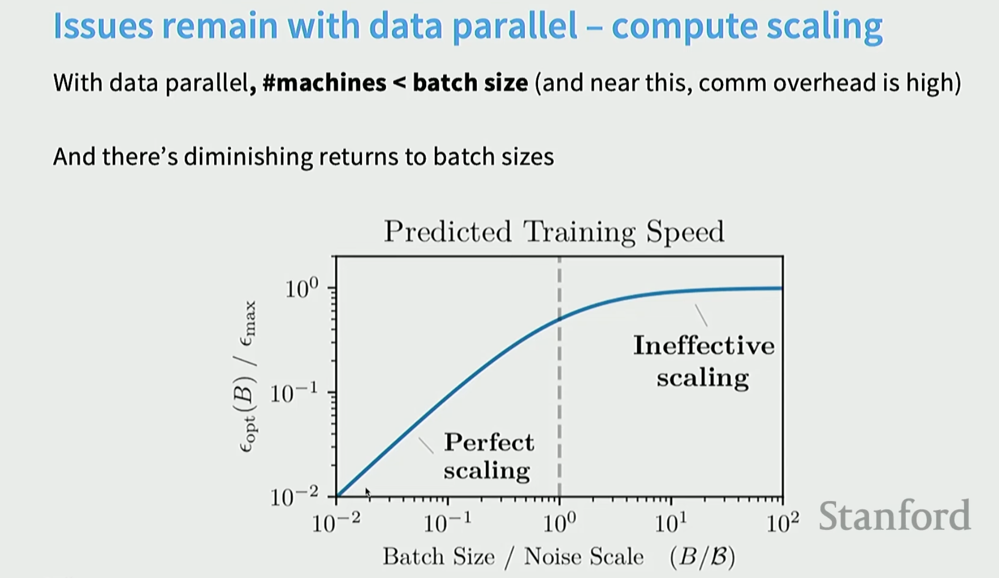



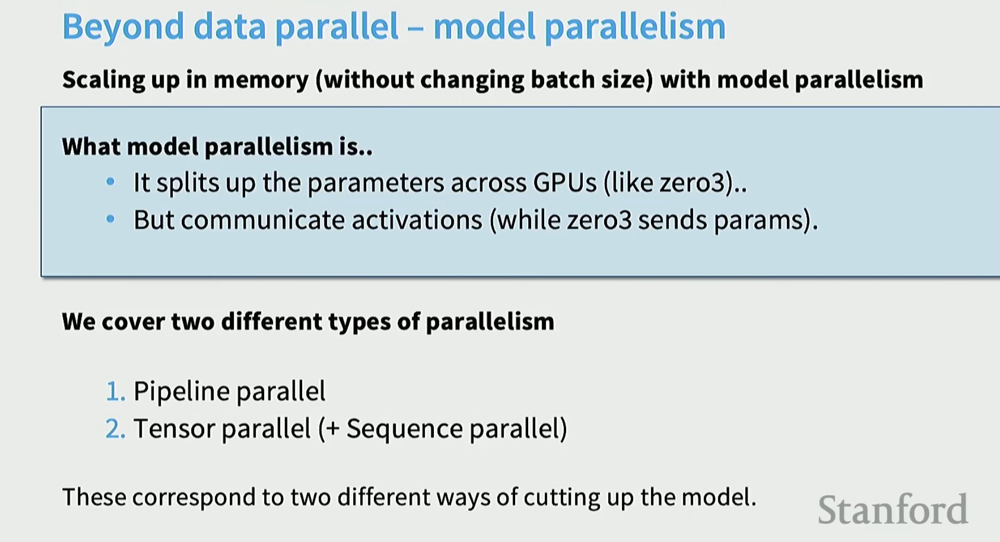

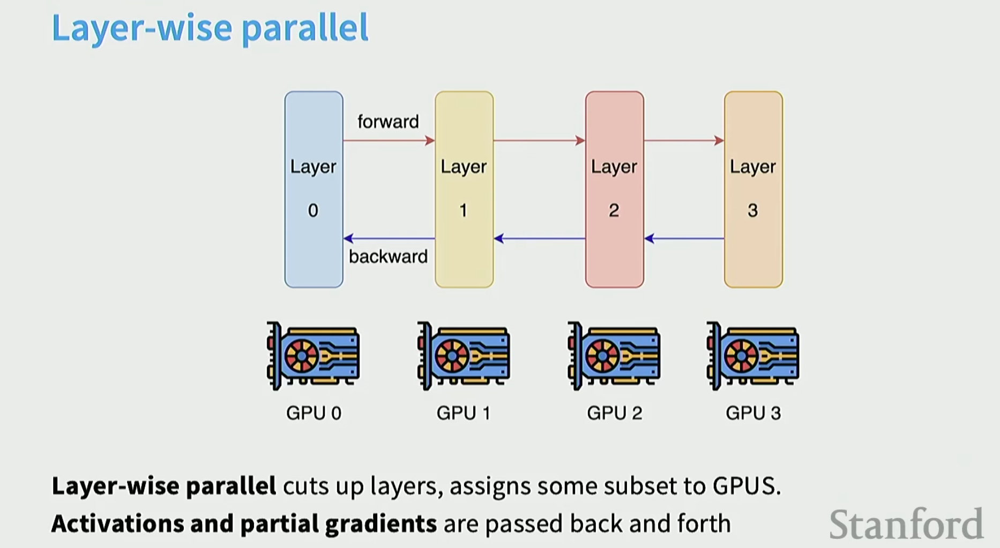

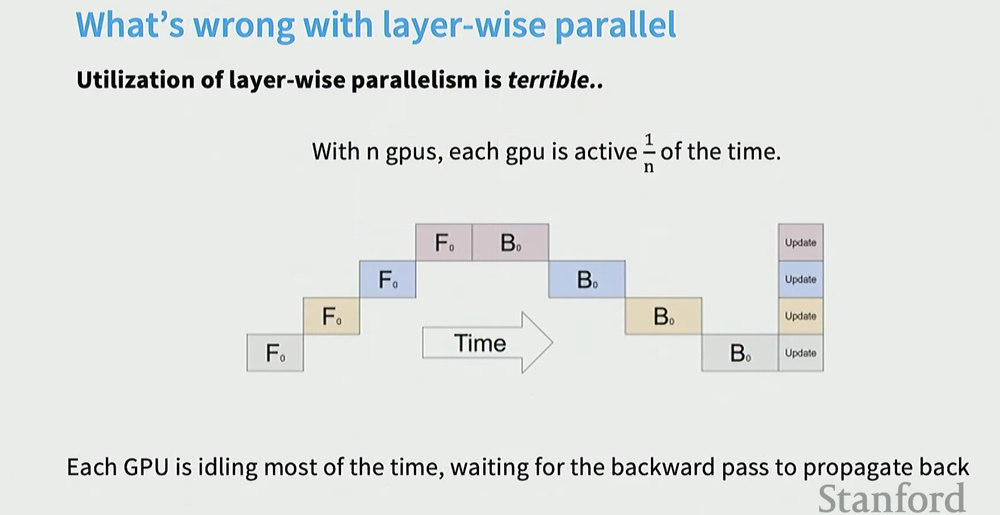

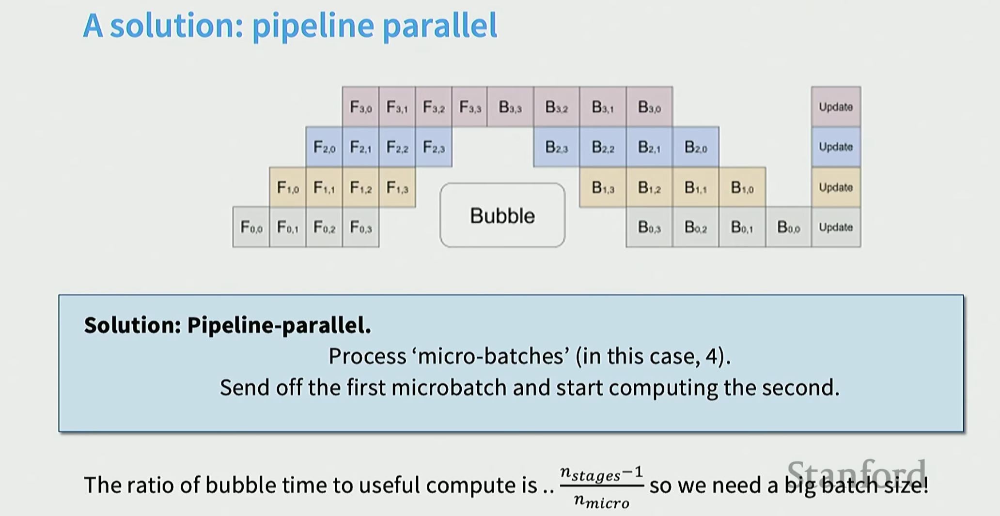

...

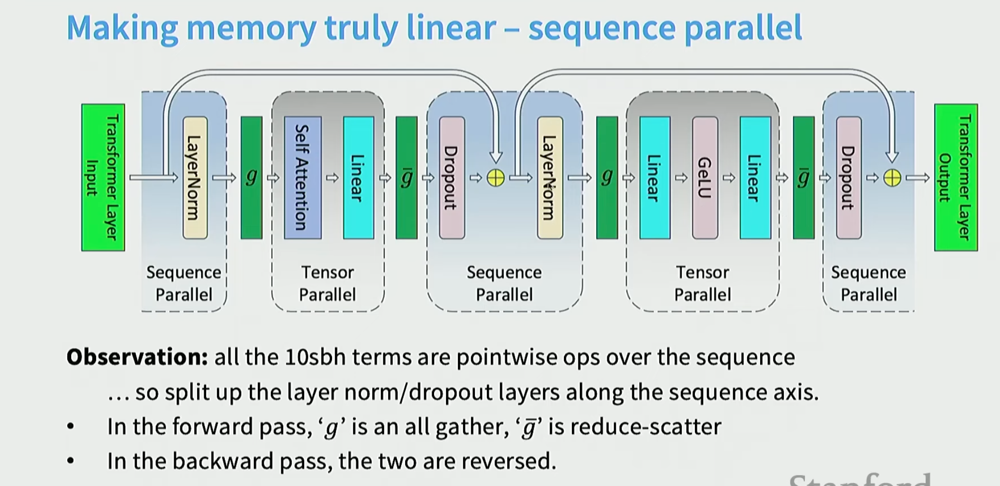

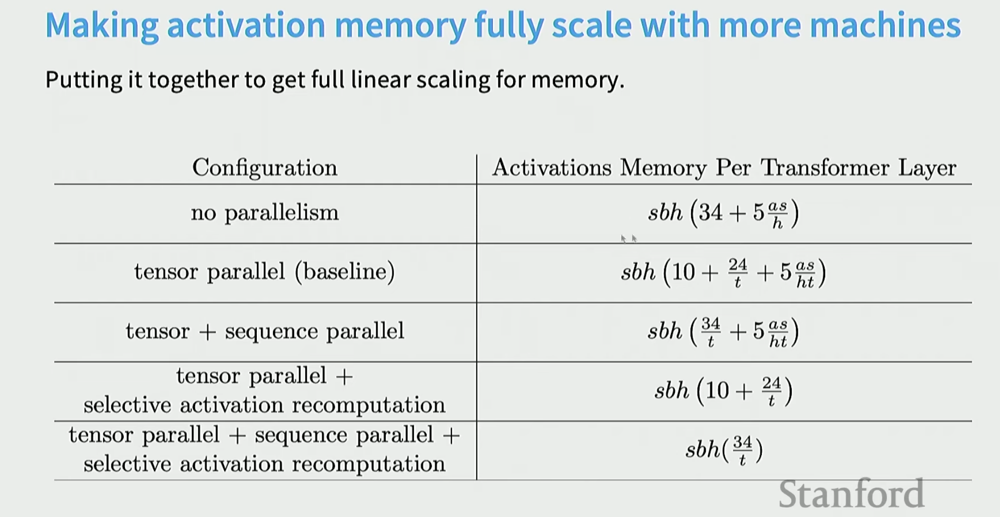

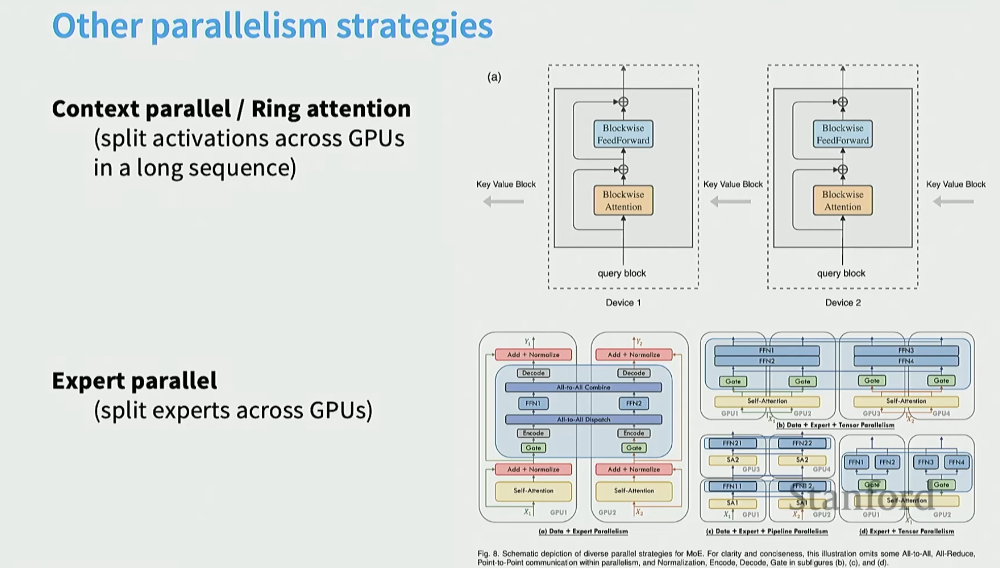

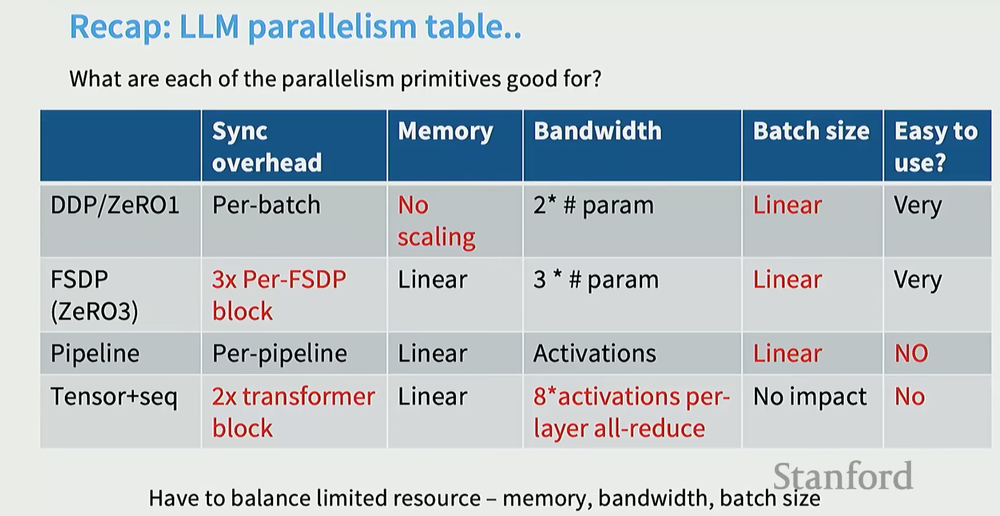

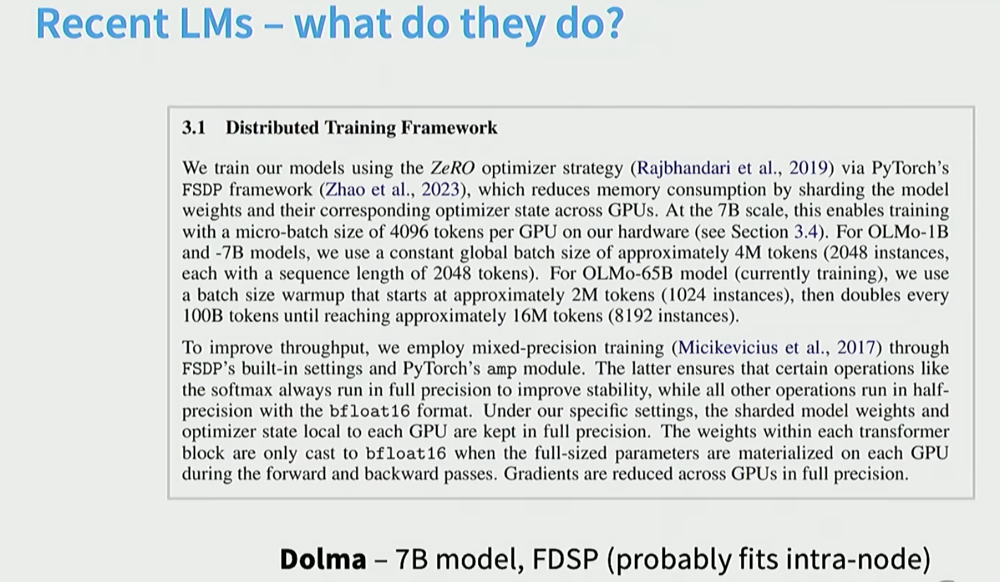

